In [1]:
from spmf import Spmf
import numpy as np
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import ast
pd.options.plotting.backend = "plotly"
import plotly.express as px
# from chart_studio import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.subplots as sp
from sklearn.feature_extraction.text import CountVectorizer
pd.options.display.max_colwidth = None
pd.set_option('display.max_rows', 70)
from pandas.plotting import table 
#import nltk

import nltk
import seaborn as sns
%matplotlib inline
import random
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import NMF
import pickle

# Load data

In [2]:
with open('frequent_apps_sleep_time.txt','rb') as f:
    freuqent_apps = pickle.load(f)

In [3]:
col_list1 = ["user_id", "package_name",'session','sleep_time_y']
data_0_20= pd.read_csv("data_0_20_quantile.csv", usecols=col_list1)

data_0_20['group']='group0_20'

col_list = ["user_id", "package_name",'session','sleep_time_y']
data_20_40 = pd.read_csv("data_20_40_quantile.csv", usecols=col_list)
data_20_40['group']='group20_40'

col_list = ["user_id", "package_name",'session','sleep_time_y']
data_40_60 = pd.read_csv("data_40_60_quantile.csv", usecols=col_list)
data_40_60['group']='group40_60'

col_list = ["user_id", "package_name",'session','sleep_time_y']
data_60_80 = pd.read_csv("data_60_80_quantile.csv", usecols=col_list)
data_60_80['group']='group60_80'

col_list = ["user_id", "package_name",'session','sleep_time_y']
data_80_100 = pd.read_csv("data_80_100_quantile.csv", usecols=col_list)
data_80_100['group']='group80_100'

## Group 0-20

In [11]:
data_0_20['start']=data_0_20.groupby('user_id').session.shift(1)!=data_0_20.session

data_0_20['end']=data_0_20.groupby('user_id').session.shift(-1)!=data_0_20.session

user_corpus_0_20=data_0_20.groupby(['user_id','session']).package_name.apply(' '.join)

user_corpus_with_start_end_0_20='start '+user_corpus_0_20+ ' end'

In [12]:
frequent_apps_without_start_end=set(freuqent_apps)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

df_frequent_app_count = data_0_20[data_0_20.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

data_0_20['next_app'] = data_0_20.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

df_next_app_count=data_0_20[data_0_20.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

frequent_apps_without_start=set(freuqent_apps)
frequent_apps_without_start.remove("start")

df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()


df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_0_20.start.sum(),columns=['app_count'],index=['start']))

df_frequent_app_count=df_frequent_app_count.reset_index()

start_numerator=data_0_20[(data_0_20.start)&(data_0_20.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

df_numerator=df_numerator.append(start_numerator)

df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

df_transaction_0_20 = df_numerator.merge(df_frequent_app_count, on='package_name')

df_transaction_0_20['probability'] =df_transaction_0_20.next_count/df_transaction_0_20.app_count

df_transaction_0_20.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [13]:
transitions_for_top1=df_transaction_0_20[(df_transaction_0_20.package_name.isin(set(freuqent_apps)))&(df_transaction_0_20.next_app.isin(set(freuqent_apps)))]  
transitions_for_top1['probability']=transitions_for_top1.groupby('package_name').probability.transform(lambda x: x  / x.sum())

In [14]:
Transaction_matrix_nomalized1 = transitions_for_top1.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix_nomalized1=Transaction_matrix_nomalized1.fillna(0)

Transaction_matrix1 = df_transaction_0_20.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix1=Transaction_matrix1.fillna(0)

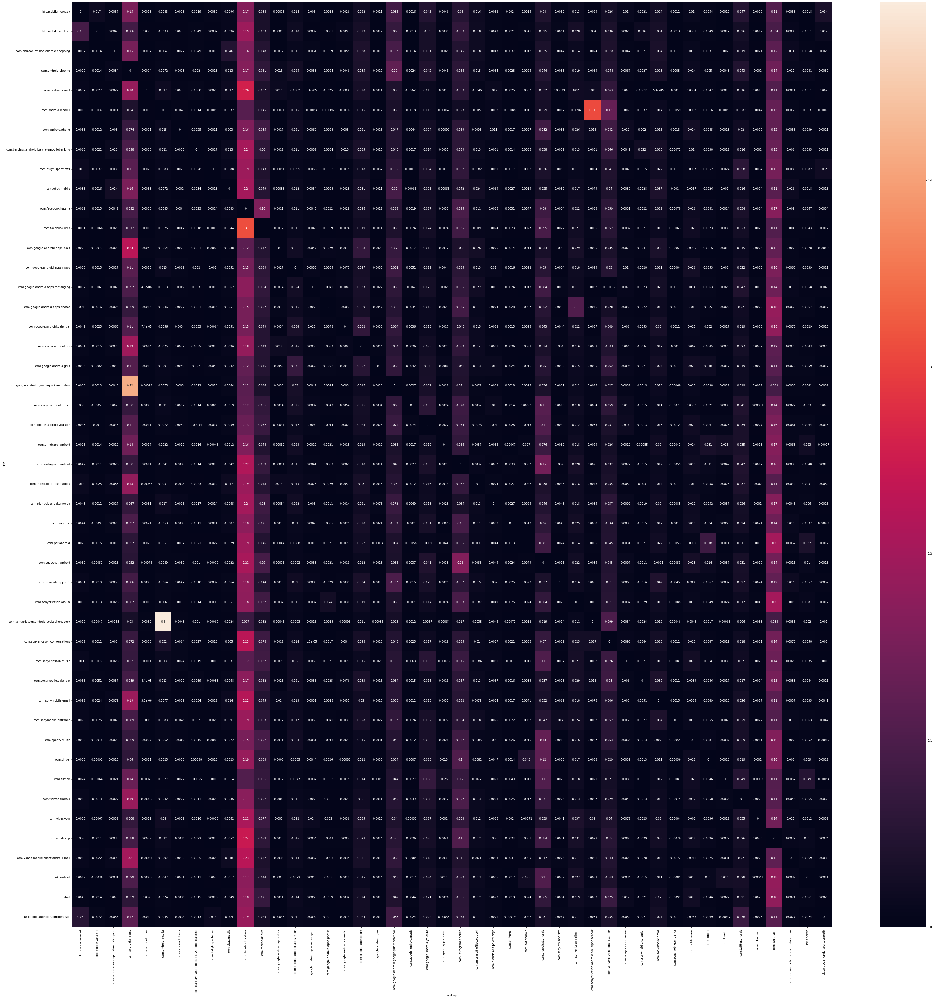

In [15]:
fig, ax = plt.subplots(figsize=(60,60))  
ax = sns.heatmap(Transaction_matrix_nomalized1, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_0_20_nomalized_test.png')
plt.show()

In [16]:
df1 = np.log10(Transaction_matrix_nomalized1)
df1 = df1.replace([np.inf, -np.inf], np.nan)

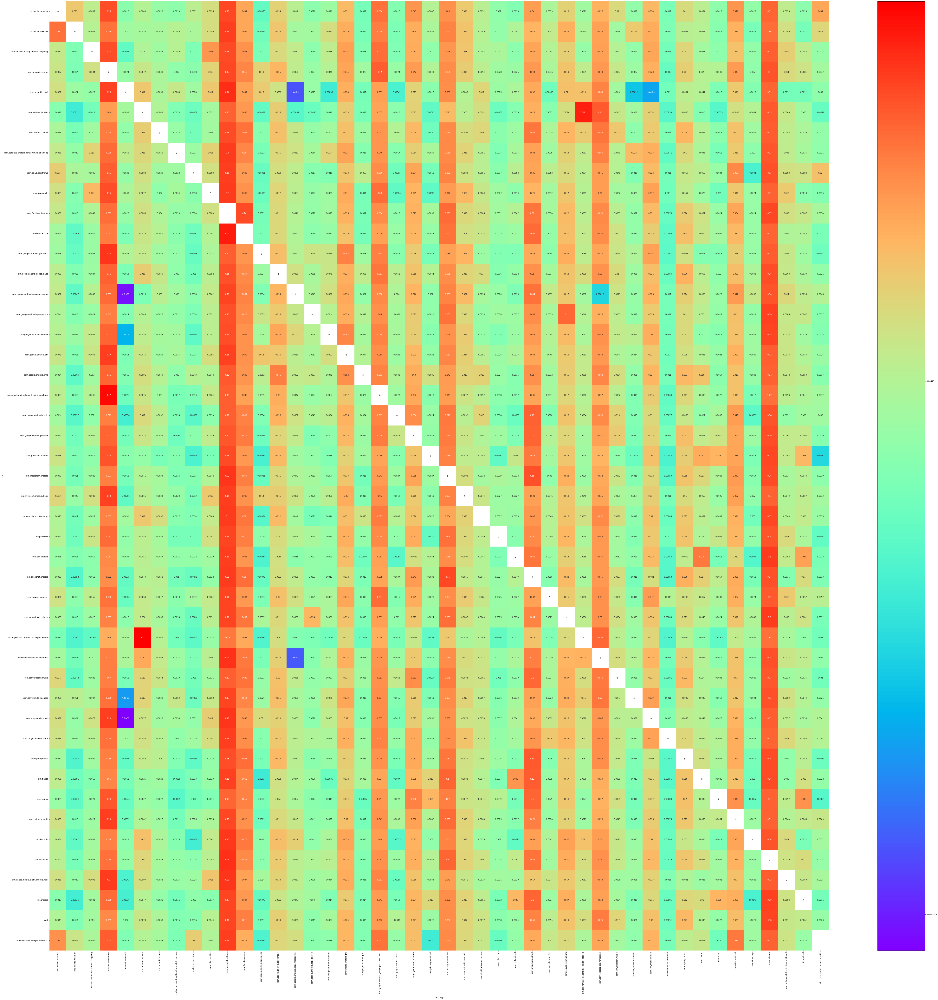

In [17]:
from matplotlib.colors import ListedColormap

fig, ax = plt.subplots(figsize=(90,90))
sns.heatmap(
    np.where(df1.isna(), 0, np.nan),
    #ax=ax[0, 0],
    cbar=False,
    annot=np.full_like(df1, "0", dtype=object),
    fmt="",
    annot_kws={"size": 10, "va": "center_baseline", "color": "black"},
    cmap=ListedColormap(['none']))
    #linewidth=0)
sns.heatmap(
    df1,
    #ax=ax[0, 0],
    cbar=False,
    annot=Transaction_matrix_nomalized1,
    #fmt="",
    #annot_kws={"size": 10, "va": "center_baseline"},
    cmap=sns.color_palette("rainbow", as_cmap=True))
cbar = ax.figure.colorbar(ax.collections[1], ticks=[-5.226761393206698,-2.35303706197875,-0.19464998766607708])
cbar.ax.set_yticklabels(['0.0000059','0.00443','0.63877'])
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.show()

## Group 20_40 quantile

In [4]:
data_20_40['start']=data_20_40.groupby('user_id').session.shift(1)!=data_20_40.session

data_20_40['end']=data_20_40.groupby('user_id').session.shift(-1)!=data_20_40.session

user_corpus_20_40=data_20_40.groupby(['user_id','session']).package_name.apply(' '.join)

user_corpus_with_start_end_20_40='start '+user_corpus_20_40+ ' end'

In [5]:
frequent_apps_without_start_end=set(freuqent_apps)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

df_frequent_app_count = data_20_40[data_20_40.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

data_20_40['next_app'] = data_20_40.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

df_next_app_count=data_20_40[data_20_40.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

frequent_apps_without_start=set(freuqent_apps)
frequent_apps_without_start.remove("start")

df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()

df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_20_40.start.sum(),columns=['app_count'],index=['start']))

df_frequent_app_count=df_frequent_app_count.reset_index()

start_numerator=data_20_40[(data_20_40.start)&(data_20_40.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

df_numerator=df_numerator.append(start_numerator)

df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

df_transaction_20_40 = df_numerator.merge(df_frequent_app_count, on='package_name')

df_transaction_20_40['probability'] =df_transaction_20_40.next_count/df_transaction_20_40.app_count

df_transaction_20_40.drop(['next_count', 'app_count'], axis=1, inplace=True)


transitions_for_top2=df_transaction_20_40[(df_transaction_20_40.package_name.isin(set(freuqent_apps)))&(df_transaction_20_40.next_app.isin(set(freuqent_apps)))]  
transitions_for_top2['probability']=transitions_for_top2.groupby('package_name').probability.transform(lambda x: x  / x.sum())

In [6]:
Transaction_matrix_nomalized2 = transitions_for_top2.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix_nomalized2=Transaction_matrix_nomalized2.fillna(0)

Transaction_matrix2 = df_transaction_20_40.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix2=Transaction_matrix2.fillna(0)

## Transition Matrix

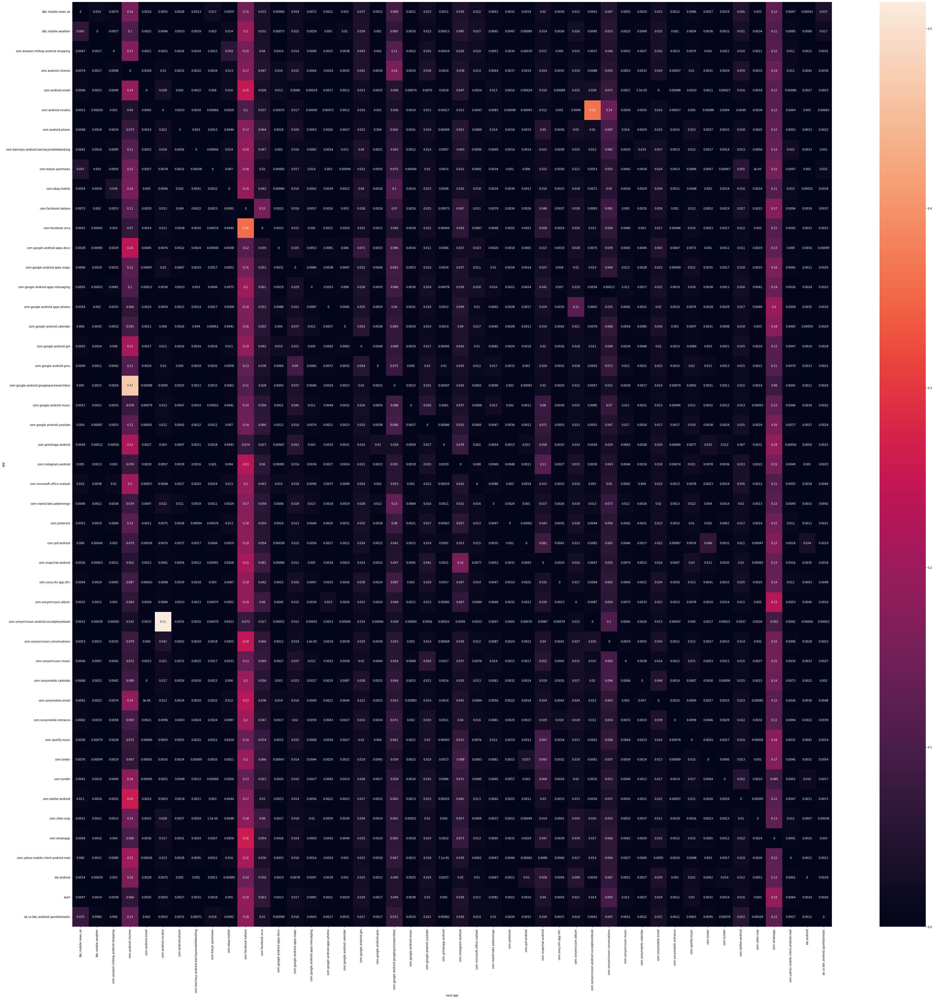

In [7]:
fig, ax = plt.subplots(figsize=(60,60))  
ax = sns.heatmap(Transaction_matrix_nomalized2, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_20_40_nomalized_test.png')
plt.show()

In [9]:
df3 = np.log10(Transaction_matrix_nomalized3)
df3 = df3.replace([np.inf, -np.inf], np.nan)

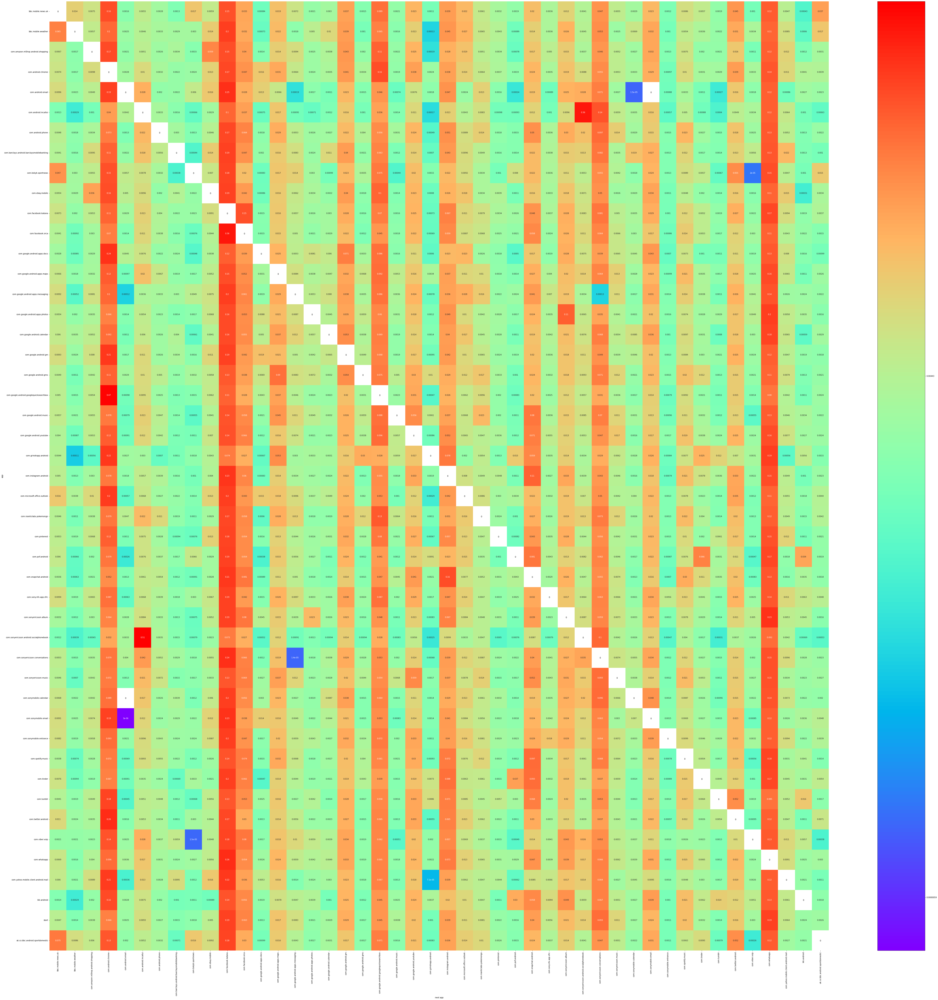

In [10]:
from matplotlib.colors import ListedColormap

fig, ax = plt.subplots(figsize=(90,90))
sns.heatmap(
    np.where(df2.isna(), 0, np.nan),
    #ax=ax[0, 0],
    cbar=False,
    annot=np.full_like(df2, "0", dtype=object),
    fmt="",
    annot_kws={"size": 10, "va": "center_baseline", "color": "black"},
    cmap=ListedColormap(['none']))
    #linewidth=0)
sns.heatmap(
    df2,
    #ax=ax[0, 0],
    cbar=False,
    annot=Transaction_matrix_nomalized2,
    #fmt="",
    #annot_kws={"size": 10, "va": "center_baseline"},
    cmap=sns.color_palette("rainbow", as_cmap=True))
cbar = ax.figure.colorbar(ax.collections[1], ticks=[-5.226761393206698,-2.35303706197875,-0.19464998766607708])
cbar.ax.set_yticklabels(['0.0000059','0.00443','0.63877'])
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.show()

## Group 40_60 quantile

In [23]:
data_40_60['start']=data_40_60.groupby('user_id').session.shift(1)!=data_40_60.session

data_40_60['end']=data_40_60.groupby('user_id').session.shift(-1)!=data_40_60.session

user_corpus_40_60=data_40_60.groupby(['user_id','session']).package_name.apply(' '.join)

user_corpus_with_start_end_40_60='start '+user_corpus_40_60+ ' end'

In [24]:
frequent_apps_without_start_end=set(freuqent_apps)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

df_frequent_app_count = data_40_60[data_40_60.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

data_40_60['next_app'] = data_40_60.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

df_next_app_count=data_40_60[data_40_60.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

frequent_apps_without_start=set(freuqent_apps)
frequent_apps_without_start.remove("start")

df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()

df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_40_60.start.sum(),columns=['app_count'],index=['start']))

df_frequent_app_count=df_frequent_app_count.reset_index()

start_numerator=data_40_60[(data_40_60.start)&(data_40_60.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

df_numerator=df_numerator.append(start_numerator)

df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

df_transaction_40_60 = df_numerator.merge(df_frequent_app_count, on='package_name')

df_transaction_40_60['probability'] =df_transaction_40_60.next_count/df_transaction_40_60.app_count

df_transaction_40_60.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [28]:
transitions_for_top3=df_transaction_40_60[(df_transaction_40_60.package_name.isin(set(freuqent_apps)))&(df_transaction_40_60.next_app.isin(set(freuqent_apps)))]  
transitions_for_top3['probability']=transitions_for_top3.groupby('package_name').probability.transform(lambda x: x  / x.sum())

In [30]:
Transaction_matrix_nomalized3 = transitions_for_top3.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix_nomalized3=Transaction_matrix_nomalized3.fillna(0)

Transaction_matrix3 = df_transaction_40_60.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix3=Transaction_matrix3.fillna(0)

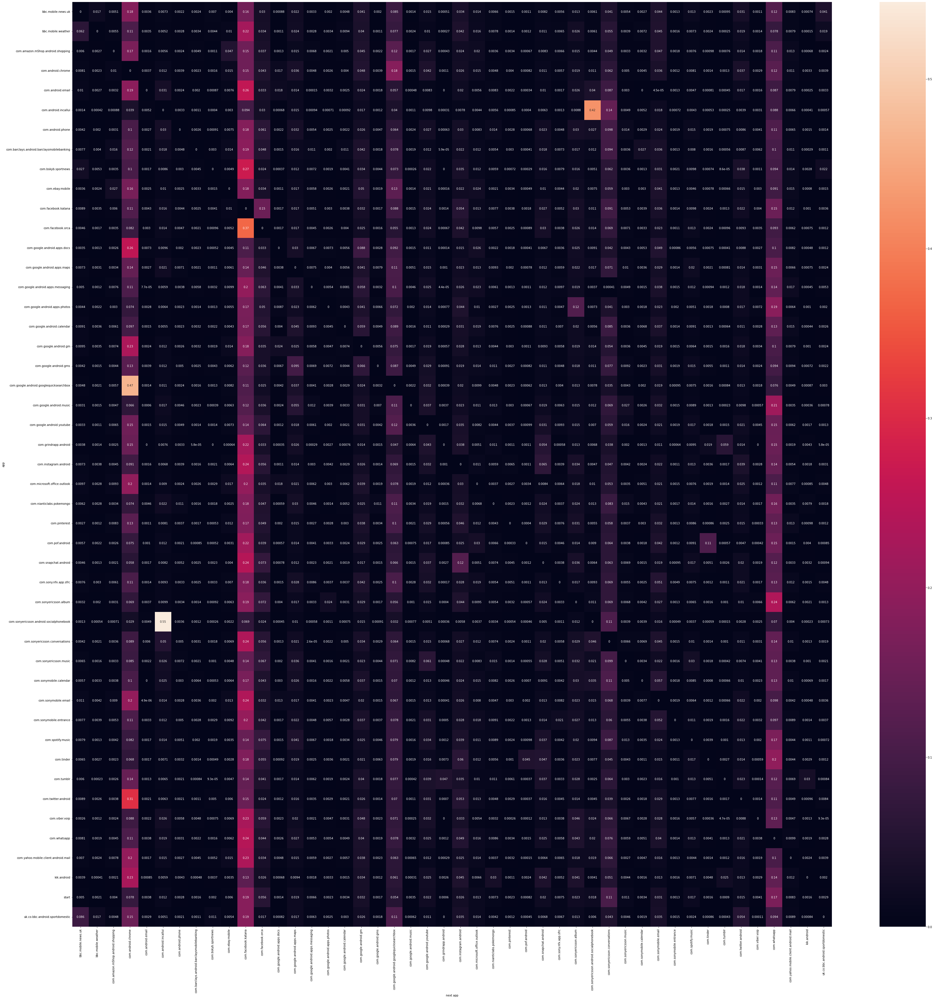

In [32]:
fig, ax = plt.subplots(figsize=(60,60))  
ax = sns.heatmap(Transaction_matrix_nomalized3, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_40_60_nomalized_test.png')
plt.show()

In [35]:
df3 = np.log10(Transaction_matrix_nomalized3)
df3 = df3.replace([np.inf, -np.inf], np.nan)

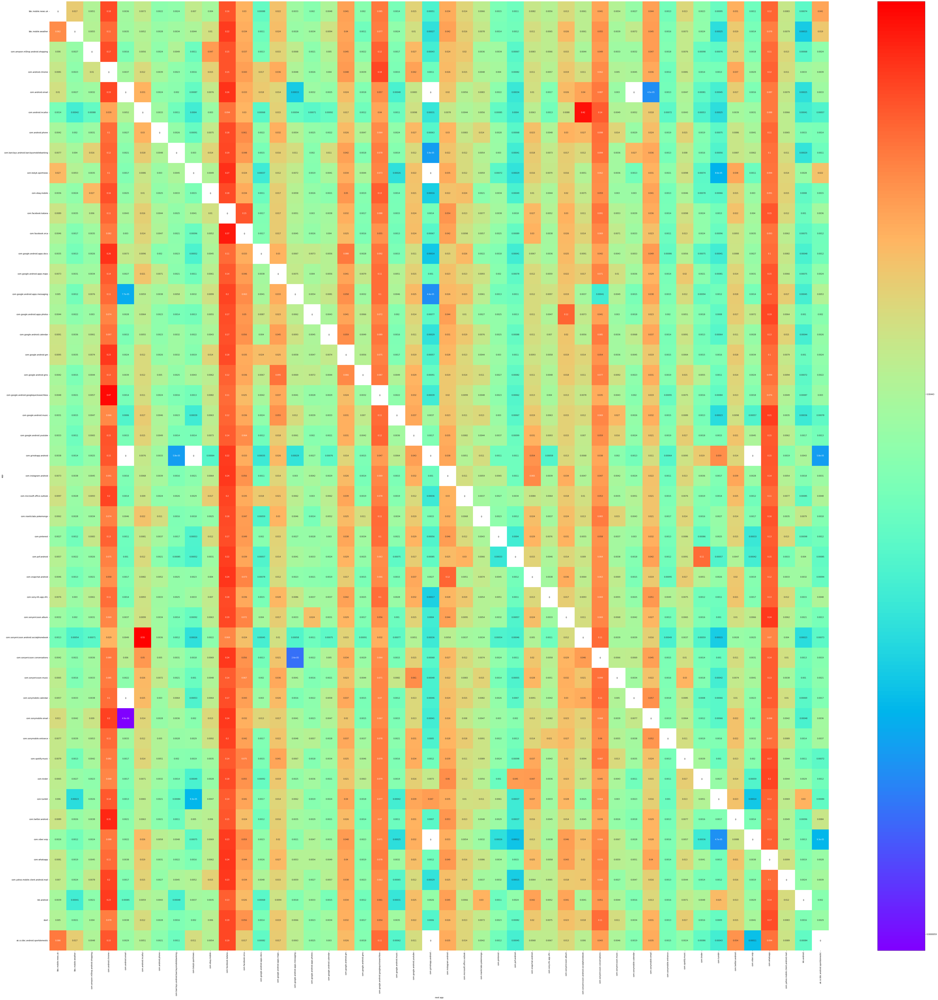

In [36]:
from matplotlib.colors import ListedColormap

fig, ax = plt.subplots(figsize=(90,90))
sns.heatmap(
    np.where(df3.isna(), 0, np.nan),
    #ax=ax[0, 0],
    cbar=False,
    annot=np.full_like(df3, "0", dtype=object),
    fmt="",
    annot_kws={"size": 10, "va": "center_baseline", "color": "black"},
    cmap=ListedColormap(['none']))
    #linewidth=0)
sns.heatmap(
    df3,
    #ax=ax[0, 0],
    cbar=False,
    annot=Transaction_matrix_nomalized3,
    #fmt="",
    #annot_kws={"size": 10, "va": "center_baseline"},
    cmap=sns.color_palette("rainbow", as_cmap=True))
cbar = ax.figure.colorbar(ax.collections[1], ticks=[-5.226761393206698,-2.35303706197875,-0.19464998766607708])
cbar.ax.set_yticklabels(['0.0000059','0.00443','0.63877'])
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.show()

## Group 60-80 quantile

In [37]:
data_60_80['start']=data_60_80.groupby('user_id').session.shift(1)!=data_60_80.session

data_60_80['end']=data_60_80.groupby('user_id').session.shift(-1)!=data_60_80.session

user_corpus_60_80=data_60_80.groupby(['user_id','session']).package_name.apply(' '.join)

user_corpus_with_start_end_60_80='start '+user_corpus_60_80+ ' end'

In [38]:
frequent_apps_without_start_end=set(freuqent_apps)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

df_frequent_app_count = data_60_80[data_60_80.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

data_60_80['next_app'] = data_60_80.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

df_next_app_count=data_60_80[data_60_80.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

frequent_apps_without_start=set(freuqent_apps)
frequent_apps_without_start.remove("start")

df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start)].reset_index()

df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_60_80.start.sum(),columns=['app_count'],index=['start']))

df_frequent_app_count=df_frequent_app_count.reset_index()

start_numerator=data_60_80[(data_60_80.start)&(data_60_80.package_name.isin(frequent_apps_without_start))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

df_numerator=df_numerator.append(start_numerator)

df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

df_transaction_60_80 = df_numerator.merge(df_frequent_app_count, on='package_name')

df_transaction_60_80['probability'] =df_transaction_60_80.next_count/df_transaction_60_80.app_count

df_transaction_60_80.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [39]:
transitions_for_top4=df_transaction_60_80[(df_transaction_60_80.package_name.isin(set(freuqent_apps)))&(df_transaction_60_80.next_app.isin(set(freuqent_apps)))]  
transitions_for_top4['probability']=transitions_for_top4.groupby('package_name').probability.transform(lambda x: x  / x.sum())

In [40]:
Transaction_matrix_nomalized4 = transitions_for_top4.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix_nomalized4=Transaction_matrix_nomalized4.fillna(0)

Transaction_matrix4 = df_transaction_60_80.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix4=Transaction_matrix4.fillna(0)

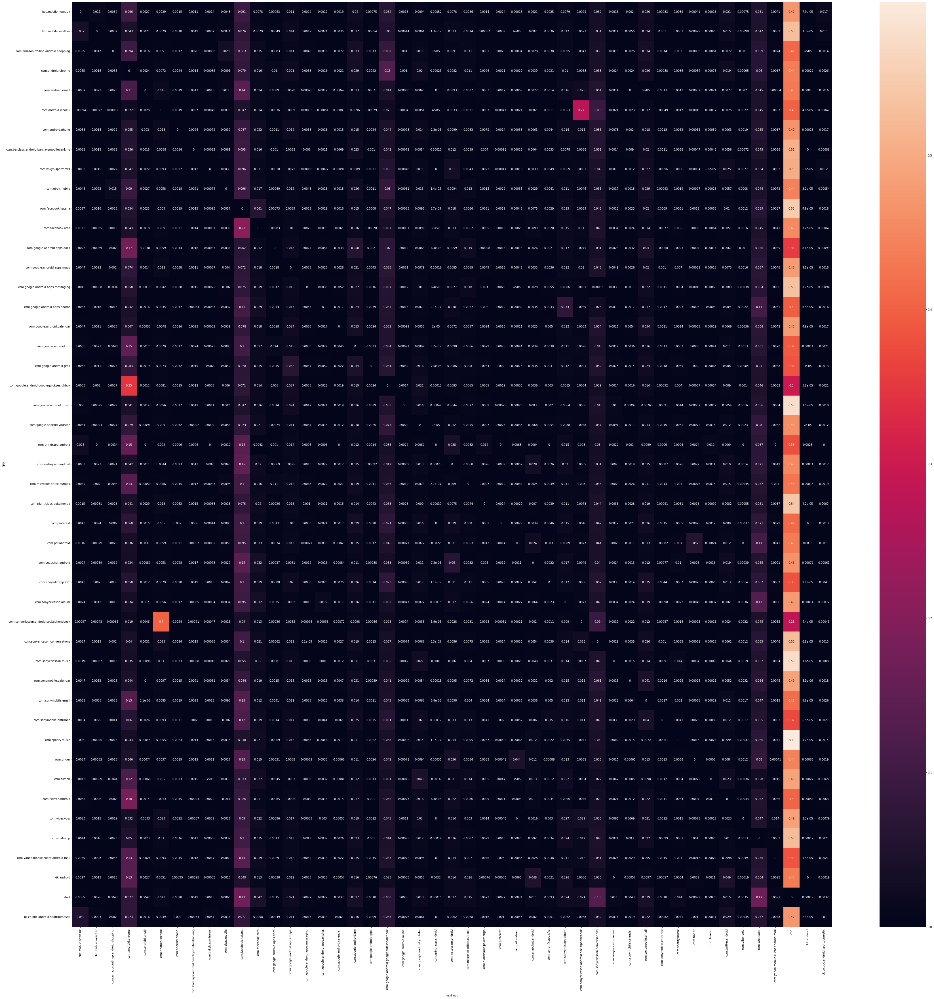

In [41]:
fig, ax = plt.subplots(figsize=(60,60))  
ax = sns.heatmap(Transaction_matrix_nomalized4, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_40_60_nomalized_test.png')
plt.show()

In [42]:
df4 = np.log10(Transaction_matrix_nomalized4)
df4 = df4.replace([np.inf, -np.inf], np.nan)

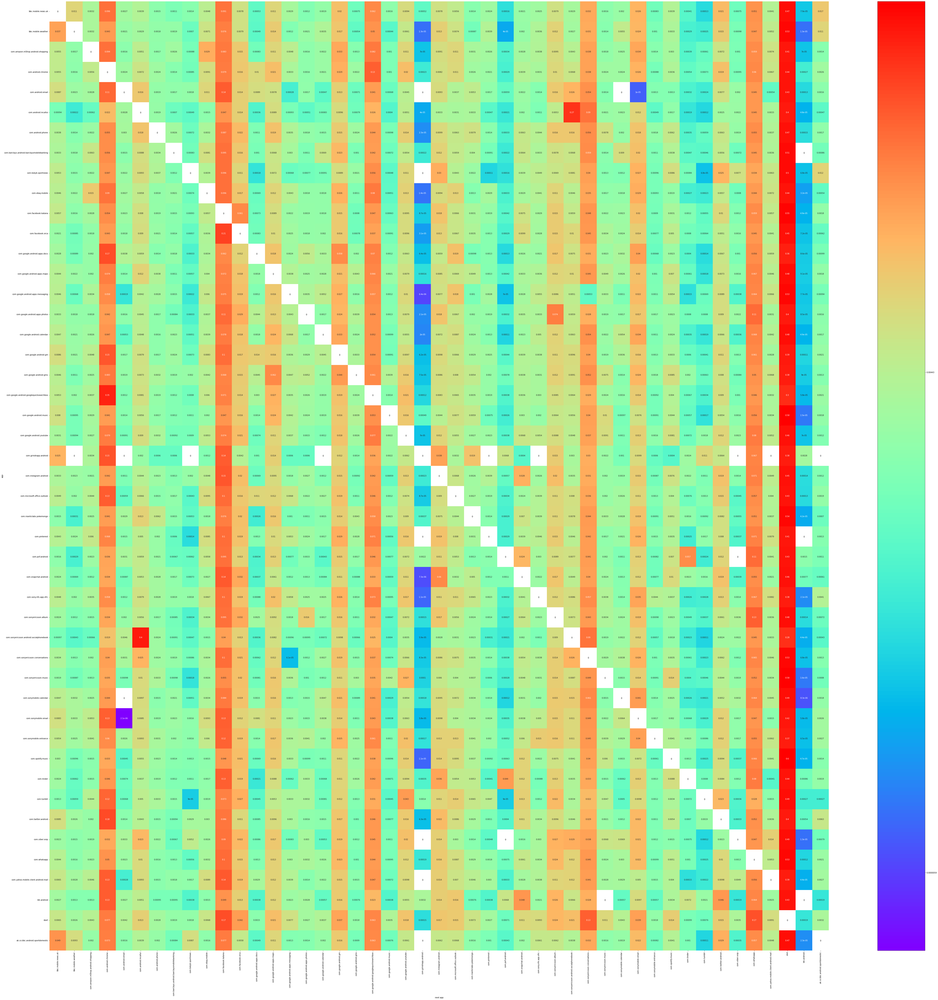

In [43]:
from matplotlib.colors import ListedColormap

fig, ax = plt.subplots(figsize=(90,90))
sns.heatmap(
    np.where(df4.isna(), 0, np.nan),
    #ax=ax[0, 0],
    cbar=False,
    annot=np.full_like(df4, "0", dtype=object),
    fmt="",
    annot_kws={"size": 10, "va": "center_baseline", "color": "black"},
    cmap=ListedColormap(['none']))
    #linewidth=0)
sns.heatmap(
    df4,
    #ax=ax[0, 0],
    cbar=False,
    annot=Transaction_matrix_nomalized4,
    #fmt="",
    #annot_kws={"size": 10, "va": "center_baseline"},
    cmap=sns.color_palette("rainbow", as_cmap=True))
cbar = ax.figure.colorbar(ax.collections[1], ticks=[-5.226761393206698,-2.35303706197875,-0.19464998766607708])
cbar.ax.set_yticklabels(['0.0000059','0.00443','0.63877'])
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.show()

## Group 80-100 quantile

In [44]:
data_80_100['start']=data_80_100.groupby('user_id').session.shift(1)!=data_80_100.session

data_80_100['end']=data_80_100.groupby('user_id').session.shift(-1)!=data_80_100.session

user_corpus_80_100=data_80_100.groupby(['user_id','session']).package_name.apply(' '.join)

user_corpus_with_start_end_80_100='start '+user_corpus_80_100+ ' end'

In [46]:
frequent_apps_without_start_end=set(freuqent_apps)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

df_frequent_app_count = data_80_100[data_80_100.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

data_80_100['next_app'] = data_80_100.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

df_next_app_count=data_80_100[data_80_100.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

frequent_apps_without_start=set(freuqent_apps)
frequent_apps_without_start.remove("start")

df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()

df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_80_100.start.sum(),columns=['app_count'],index=['start']))

df_frequent_app_count=df_frequent_app_count.reset_index()

start_numerator=data_80_100[(data_80_100.start)&(data_80_100.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

df_numerator=df_numerator.append(start_numerator)

df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

df_transaction_80_100 = df_numerator.merge(df_frequent_app_count, on='package_name')

df_transaction_80_100['probability'] =df_transaction_80_100.next_count/df_transaction_80_100.app_count*100

df_transaction_80_100.drop(['next_count', 'app_count'], axis=1, inplace=True)



In [47]:
transitions_for_top5=df_transaction_80_100[(df_transaction_80_100.package_name.isin(set(freuqent_apps)))&(df_transaction_80_100.next_app.isin(set(freuqent_apps)))]  
transitions_for_top5['probability']=transitions_for_top5.groupby('package_name').probability.transform(lambda x: x  / x.sum())

In [48]:
Transaction_matrix_nomalized5 = transitions_for_top5.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix_nomalized5=Transaction_matrix_nomalized5.fillna(0)

Transaction_matrix5 = df_transaction_80_100.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

Transaction_matrix5=Transaction_matrix5.fillna(0)

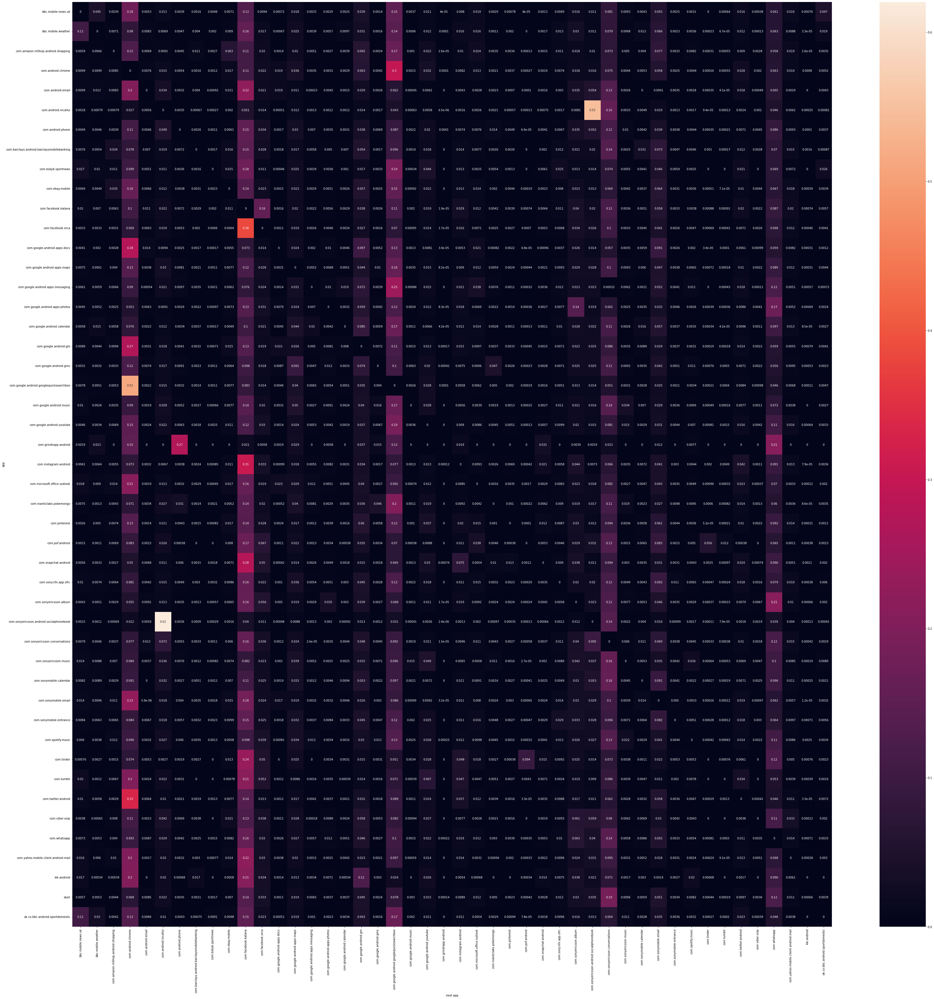

In [49]:
fig, ax = plt.subplots(figsize=(60,60))  
ax = sns.heatmap(Transaction_matrix_nomalized5, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_80_100_nomalized_test.png')
plt.show()

## Comparational transition matrix 

## Group1 comparasion